# Import Libraries and Environment Setup 

In [5]:
!pip install segmentation_models_pytorch monai
import os
import torch
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from torch.utils.data import DataLoader
from tqdm import tqdm 

import helper
from unet.models.unet import UNet
from unet.utils.dataset import TiffDataset
from unet.utils.transformers import MicroTransformers

device = "cpu"
if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"
torch.device(device)
print("Using device:", device)

FIG_DIR = "figures" 
os.makedirs(FIG_DIR, exist_ok = True)
os.makedirs("models", exist_ok = True)

Using device: mps


# Load DataSet

In [6]:
val_image_path = "data/png/test/image"
val_masks_path = "data/png/test/label"

raw_dataset = TiffDataset(image_path=val_image_path,masks_path=val_masks_path,transforms=MicroTransformers(geo_augment=False,denoise=False))
denoise_dataset = TiffDataset(image_path=val_image_path,masks_path=val_masks_path,transforms=MicroTransformers(geo_augment=False,denoise=True))


raw_loader = DataLoader(raw_dataset, batch_size=4, shuffle=False, in_order=True)
denoise_loader = DataLoader(denoise_dataset, batch_size=4, shuffle=False,in_order=True)

Found 4  (image, mask) pairs
Found 4  (image, mask) pairs


# Compare denoise effect on the U-Net

In [7]:
unet_train_log_path = "training_log/U-Net_w_km_trainning_log.csv"
unet_denoise_train_log_path = "training_log/training_km_pxiel_log_20251202_014629.csv"

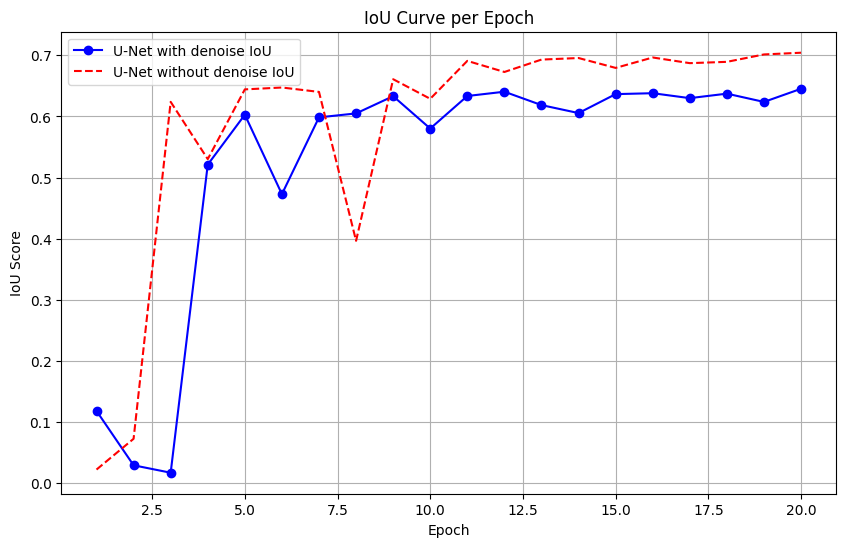

In [ ]:
train_log = pd.read_csv(unet_train_log_path)
denoise_log = pd.read_csv(unet_denoise_train_log_path)

plt.figure(figsize=(10, 6))
plt.plot(denoise_log['Epoch'], denoise_log['Val_IoU'], label='U-Net with denoise IoU', color='blue', marker='o', linestyle='-')
plt.plot(train_log['Epoch'], train_log['Val_IoU'], label='U-Net without denoise IoU', color='red', linestyle='--')

plt.title('IoU Curve per Epoch')
plt.xlabel('Epoch')
plt.ylabel('IoU Score')

plt.legend()
plt.grid(True)
plt.savefig(f"{FIG_DIR}/compare_denoise_unet_iou.png")
plt.show()


### Result explanation
The results show that U-Net without denoising performs better. This means that denoising did not improve segmentation.

- The denoising step may remove small details that the model needs.
- The U-Net may naturally learn how to handle noise.
- The denoising method might not match the type of noise in the dataset.

### Why compare them
We want to check if denoising actually improves the model’s performance.

# Compare the U-Net models trained with the Mean Teacher method using only labeled data and using both labeled and unlabeled data.

Model A and Model B are both trained with the Mean Teacher method. During training, Model A is trained using only labeled images, while Model B is trained using both labeled and unlabeled images.

File 'best_iou_MT_Teacher_mt_pxiel_20251202_020501.pth' already exists. Skipping download.
File 'best_iou_MT_Teacher_denoise_mt_768_20251204_042506.pth' already exists. Skipping download.
torch.Size([4, 1, 768, 768]) torch.Size([4, 1, 768, 768])
Visualizing combined batch size: 4 (4 from A, 4 from B)
Figure saved to figures/mt_between_unlabeled.png


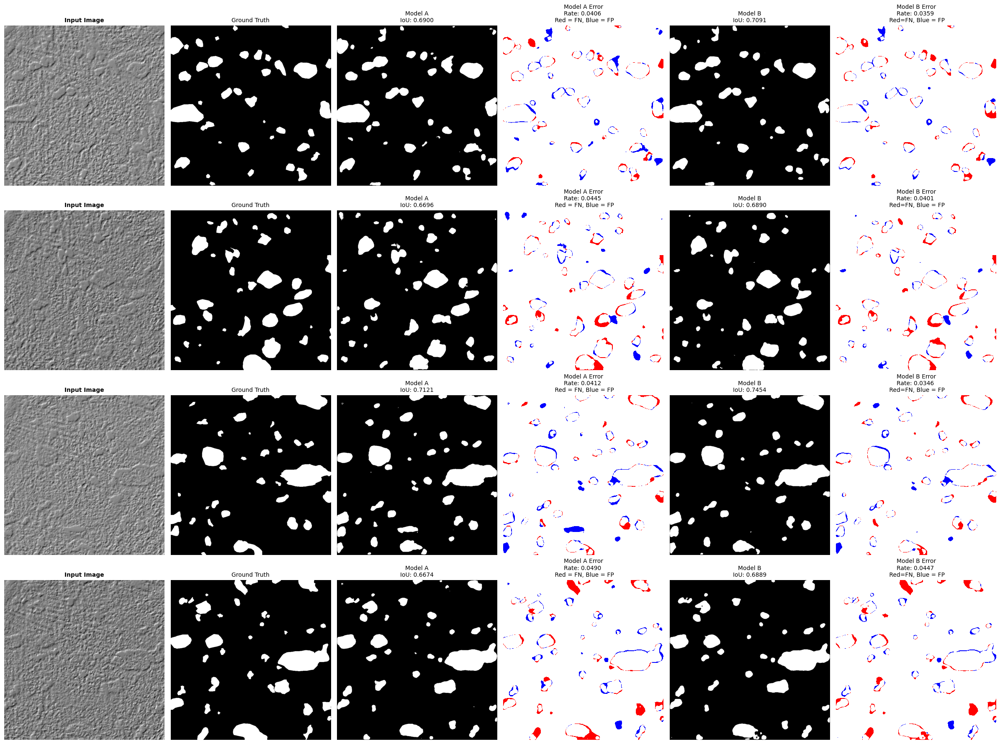

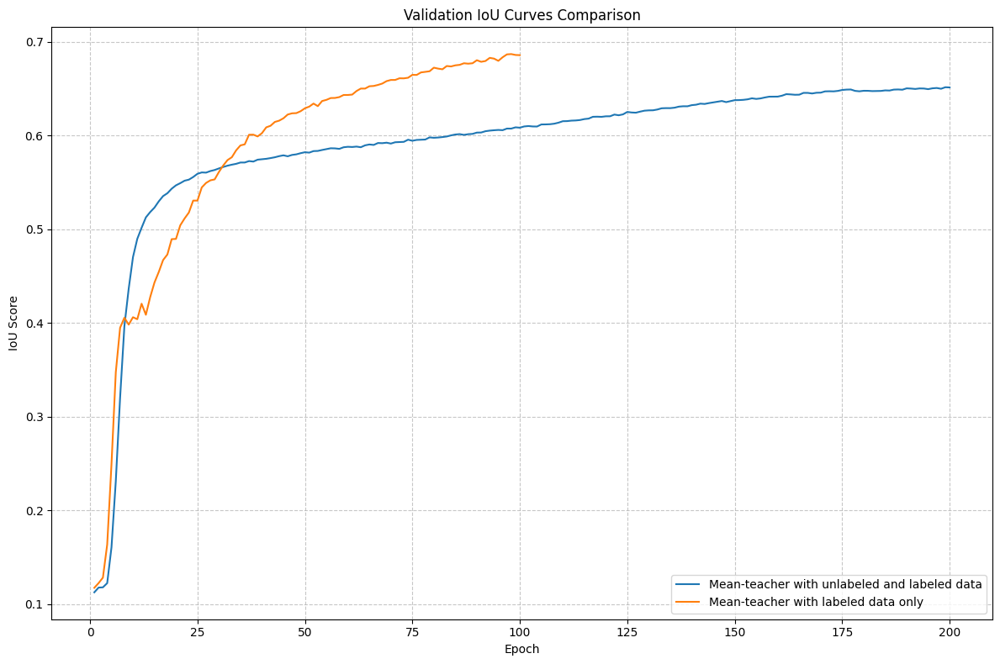

In [ ]:
url = "https://github.com/maocili/Group15_Project21_02456/releases/download/v0.0.1/best_iou_MT_Teacher_mt_pxiel_20251202_020501.pth"
mt_without_unlabled_model_pth = helper.download_model(url)
url = "https://github.com/maocili/Group15_Project21_02456/releases/download/v0.0.1/best_iou_MT_Teacher_denoise_mt_768_20251204_042506.pth"
mt_model_pth = helper.download_model(url)

mt_without_unlabled_model = UNet(in_channels=1, out_channels=2).to(device)
mt_without_unlabled_model.load_state_dict(torch.load(mt_without_unlabled_model_pth, map_location=device, weights_only=True))
mt_model = UNet(in_channels=1, out_channels=2).to(device)
mt_model.load_state_dict(torch.load(mt_model_pth, map_location=device, weights_only=True))

helper.visualize_comparison_validation(loader_A=denoise_loader, loader_B=denoise_loader,
                                       device=device, model_A=mt_without_unlabled_model, model_B=mt_model, save_path=f"{FIG_DIR}/mt_between_unlabeled.png")


mt_wo_unlabeled_df = pd.read_csv("training_log/training_mt_pxiel_log_20251202_020501.csv")  
mt_w_unlabedled_df = pd.read_csv("training_log/training_denoise_mt_768_log_20251204_042506.csv")
# mt_wo_unlabeled_df = mt_wo_unlabeled_df[mt_wo_unlabeled_df["Epoch"] <= 100]


plt.figure(figsize=(12, 8))

plt.plot(mt_wo_unlabeled_df['Epoch'], mt_wo_unlabeled_df['Val_IoU'], label='Mean-teacher with labeled data only')
plt.plot(mt_w_unlabedled_df['Epoch'], mt_w_unlabedled_df['Val_IoU'], label='Mean-teacher with unlabeled and labeled data')

plt.title('Validation IoU Curves Comparison')
plt.xlabel('Epoch')
plt.ylabel('IoU Score')
plt.legend(loc='lower right') 
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig(f"{FIG_DIR}/loss_iou.png")
plt.show()

### Result explanation
The results show that Model B (trained with labeled + unlabeled data) performs better than Model A (labeled data only). 
Model B produces cleaner segmentations and achieves higher IoU scores.

- Unlabeled data give the Mean Teacher model more examples to learn from.
- The model learns stronger features and generalizes better.

### Why compare them
We want to check if adding unlabeled data helps the Mean Teacher method learn better.

# Compare U-Net with Mean-teacher

Model A is mean-teacher and Model B is baseline model, U-Net.

In [6]:
url = "https://github.com/maocili/Group15_Project21_02456/releases/download/v0.0.1/best_iou_Standard_baseline_20251204_062857.pth"
baseline_model_pth = helper.download_model(url)

baseline_model = UNet(in_channels=1, out_channels=2).to(device)
baseline_model.load_state_dict(torch.load(baseline_model_pth, map_location=device, weights_only=True))

baseline_df = pd.read_csv("training_log/training_baseline_log_20251204_062857.csv")

File 'best_iou_Standard_baseline_20251204_062857.pth' already exists. Skipping download.


torch.Size([4, 1, 768, 768]) torch.Size([4, 1, 768, 768])
Visualizing combined batch size: 4 (4 from A, 4 from B)
Figure saved to figures/baseline_mt.png


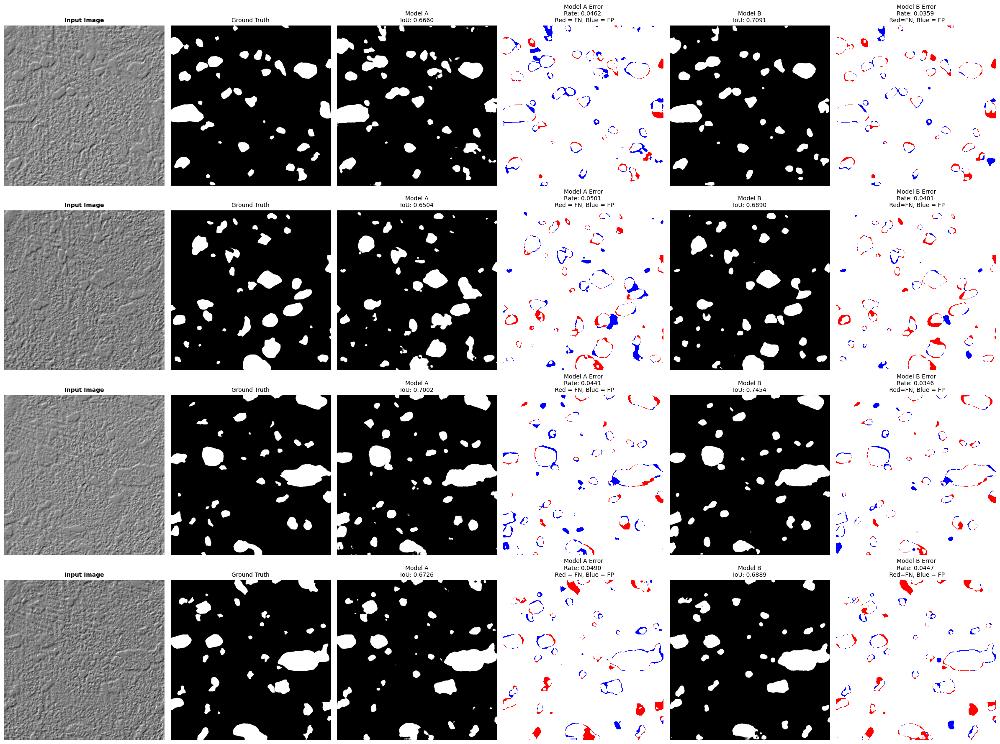

In [7]:
helper.visualize_comparison_validation(loader_A=denoise_loader, loader_B=denoise_loader,
                                       device=device, model_A=baseline_model, model_B=mt_model,save_path=f"{FIG_DIR}/baseline_mt.png")

### Result explanation
The results show that Model A (Mean Teacher) performs better than Model B (baseline U-Net). 
Model A model produces cleaner segmentations and achieves higher IoU scores.

- The teacher–student setup helps stabilize training.
- The model learns more consistent and smooth predictions.
- Mean Teacher reduces overfitting compared to the baseline U-Net.

### Why compare them
We want to check if the Mean Teacher method provides an advantage over the baseline U-Net.

# Compare different Loss Functions

The baseline model used Loss combination, Focal loss + Tversky(alpha=0.5, beta=0.5) 

File 'best_iou_Standard_loss_ce_20251202_033557.pth' already exists. Skipping download.
torch.Size([4, 1, 768, 768]) torch.Size([4, 1, 768, 768])
Visualizing combined batch size: 4 (4 from A, 4 from B)
Figure saved to figures/ce_vs_baseline.png


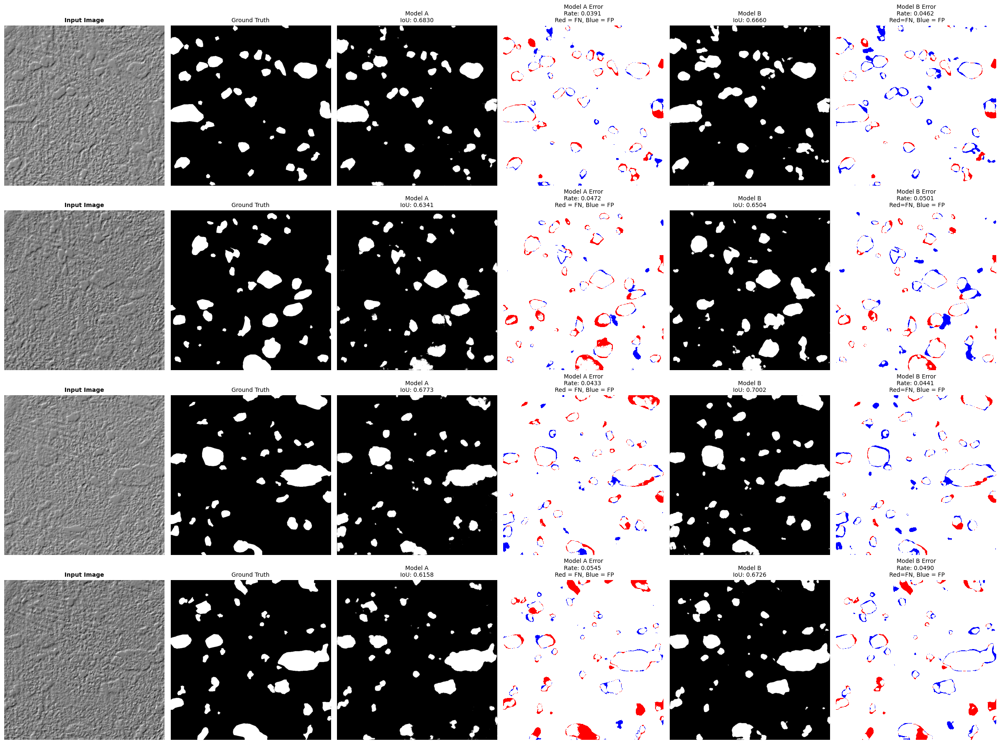

In [8]:
# CE vs Baseline
url = "https://github.com/maocili/Group15_Project21_02456/releases/download/v0.0.1/best_iou_Standard_loss_ce_20251202_033557.pth"
ce_unet_model_path = helper.download_model(url)

ce_unet = UNet(in_channels=1, out_channels=2).to(device)
ce_unet.load_state_dict(torch.load(ce_unet_model_path, map_location=device, weights_only=True))

helper.visualize_comparison_validation(loader_A=denoise_loader, loader_B=denoise_loader,
                                       device=device, model_A=ce_unet, model_B=baseline_model,save_path=f"{FIG_DIR}/ce_vs_baseline.png")

### Result Explanation
The results show that Model B (baseline model) performs slightly better than Model A (CE).

- Focal loss deals better with class imbalance.
- Tversky loss improves boundary accuracy and reduces false positives.

### Why compare them
We want to check if using only Cross-Entropy loss is enough or if the baseline loss combination is more effective for this dataset.

File 'best_iou_Standard_loss_ce_dice_20251202_034620.pth' already exists. Skipping download.
torch.Size([4, 1, 768, 768]) torch.Size([4, 1, 768, 768])
Visualizing combined batch size: 4 (4 from A, 4 from B)
Figure saved to figures/ce_d_vs_baseline.png


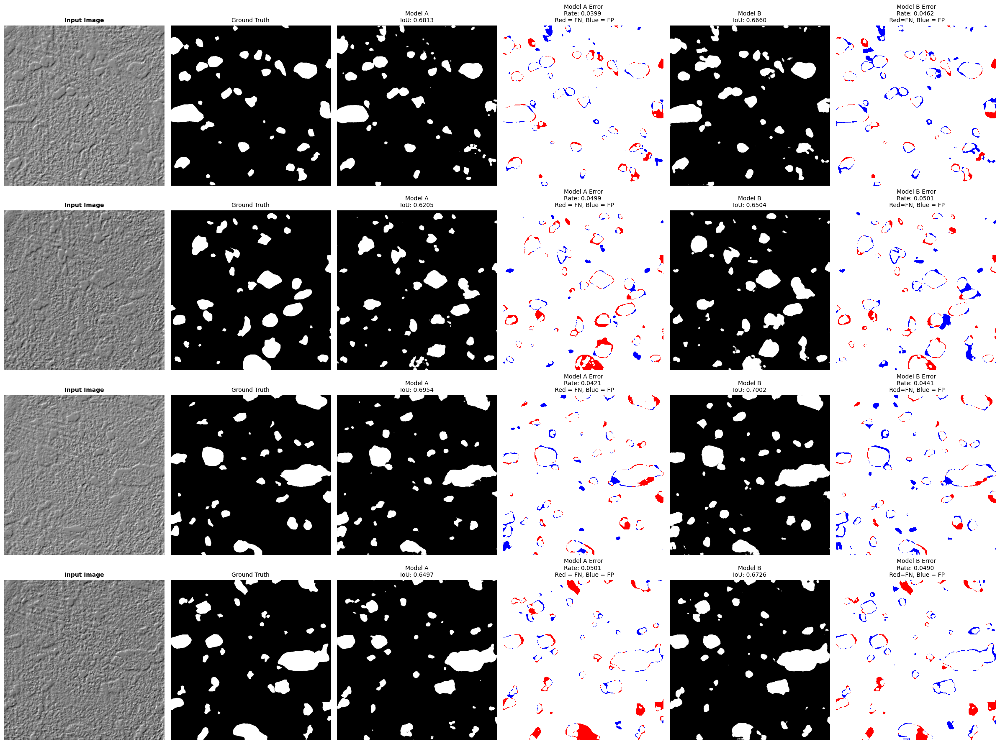

In [ ]:
# CE + Dice Loss vs Baseline
url = "https://github.com/maocili/Group15_Project21_02456/releases/download/v0.0.1/best_iou_Standard_loss_ce_dice_20251202_034620.pth"
ce_dice_unet_path = helper.download_model(url)

ce_dice_unet = UNet(in_channels=1, out_channels=2).to(device)
ce_dice_unet.load_state_dict(torch.load(ce_dice_unet_path, map_location=device, weights_only=True))

helper.visualize_comparison_validation(loader_A=denoise_loader, loader_B=denoise_loader,
                                       device=device, model_A=ce_dice_unet, model_B=baseline_model,save_path=f"{FIG_DIR}/ce_d_vs_baseline.png")

### Result explanation
The results show that Model A (CE + Dice loss) performs similarly to the baseline model.

- Dice loss helps detect small objects that CE may ignore.
- Combining CE and Dice balances pixel accuracy and shape accuracy.
- The model becomes more sensitive to class imbalance.

### Why compare them
We want to check if adding Dice loss can improve segmentation quality, especially on small or irregular shapes.

File 'best_iou_Standard_loss_ce_logdice_20251202_040133.pth' already exists. Skipping download.
torch.Size([4, 1, 768, 768]) torch.Size([4, 1, 768, 768])
Visualizing combined batch size: 4 (4 from A, 4 from B)
Figure saved to figures/f_log_vs_baseline.png


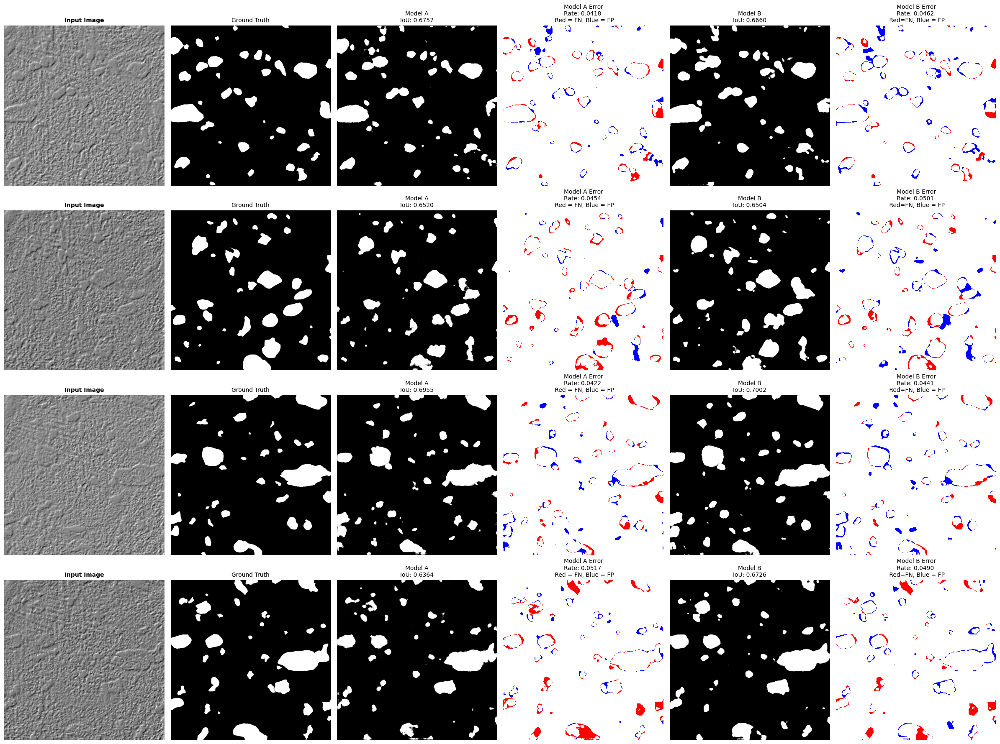

In [10]:
# Focal + Logdice vs Baseline
url = "https://github.com/maocili/Group15_Project21_02456/releases/download/v0.0.1/best_iou_Standard_loss_ce_logdice_20251202_040133.pth"
f_dice_unet_path = helper.download_model(url)

f_dice_unet = UNet(in_channels=1, out_channels=2).to(device)
f_dice_unet.load_state_dict(torch.load(f_dice_unet_path, map_location=device, weights_only=True))

helper.visualize_comparison_validation(loader_A=denoise_loader, loader_B=denoise_loader,
                                       device=device, model_A=f_dice_unet, model_B=baseline_model,save_path=f"{FIG_DIR}/f_log_vs_baseline.png")

### Result explanation
The results show that Model A (Focal + LogDice) performs slightly better than the baseline model.
It produces fewer false positives and captures shapes more accurately.

- Focal loss makes the model focus less on background pixels.
- LogDice stabilizes training and improves shape consistency.
- Together they help the model learn difficult or small shapes.

### Why compare them
We want to check if combining Focal loss with LogDice improves segmentation, especially in imbalanced regions.

File 'best_iou_Standard_dice_20251204_063916.pth' already exists. Skipping download.
torch.Size([4, 1, 768, 768]) torch.Size([4, 1, 768, 768])
Visualizing combined batch size: 4 (4 from A, 4 from B)
Figure saved to figures/dice_vs_baseline.png


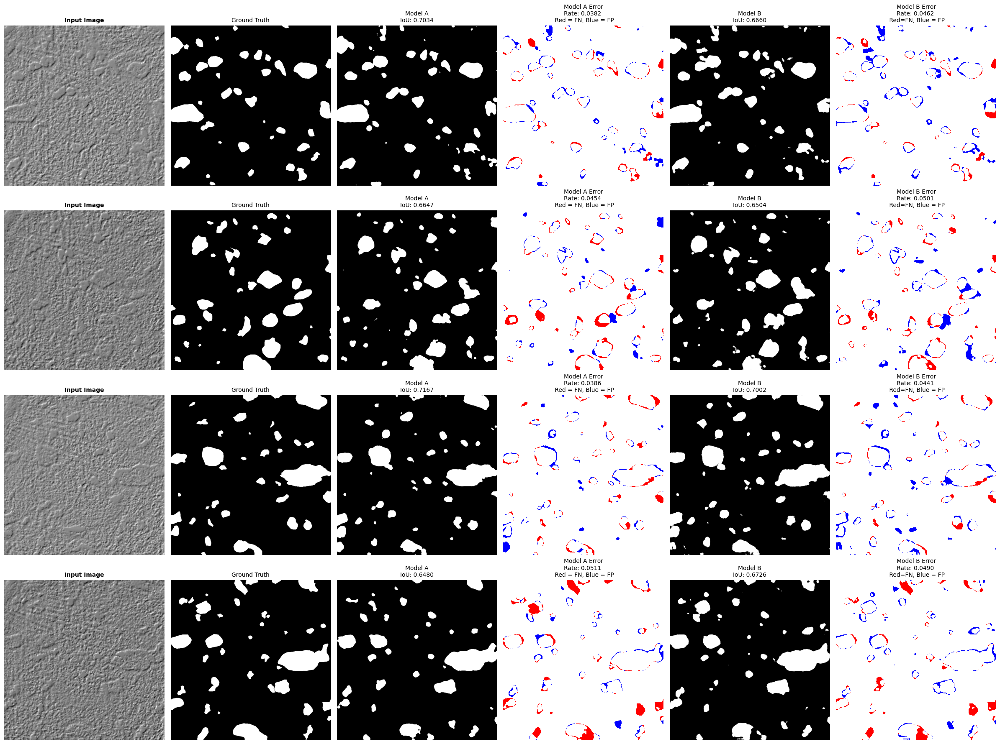

In [11]:
# Dice vs Baseline
url = "https://github.com/maocili/Group15_Project21_02456/releases/download/v0.0.1/best_iou_Standard_dice_20251204_063916.pth"
dice_unet_path = helper.download_model(url)

dice_unet = UNet(in_channels=1, out_channels=2).to(device)
dice_unet.load_state_dict(torch.load(dice_unet_path, map_location=device, weights_only=True))

helper.visualize_comparison_validation(loader_A=denoise_loader, loader_B=denoise_loader,
                                       device=device, model_A=dice_unet, model_B=baseline_model, save_path=f"{FIG_DIR}/dice_vs_baseline.png")

### Result explanation
The results show that Model A (Dice) performs similarly to the baseline model.

- Dice focuses on overlap, not per-pixel accuracy, which can help with small shapes, but without CE or Focal the model can struggle with boundary precision.

### Why compare them
We want to check if Dice loss can outperform the baseline model, since it is commonly used in segmentation tasks.

File 'best_iou_Standard_loss_f_t_0.3_0.7_20251202_041128.pth' already exists. Skipping download.
torch.Size([4, 1, 768, 768]) torch.Size([4, 1, 768, 768])
Visualizing combined batch size: 4 (4 from A, 4 from B)
Figure saved to figures/ft_37_vs_baseline.png


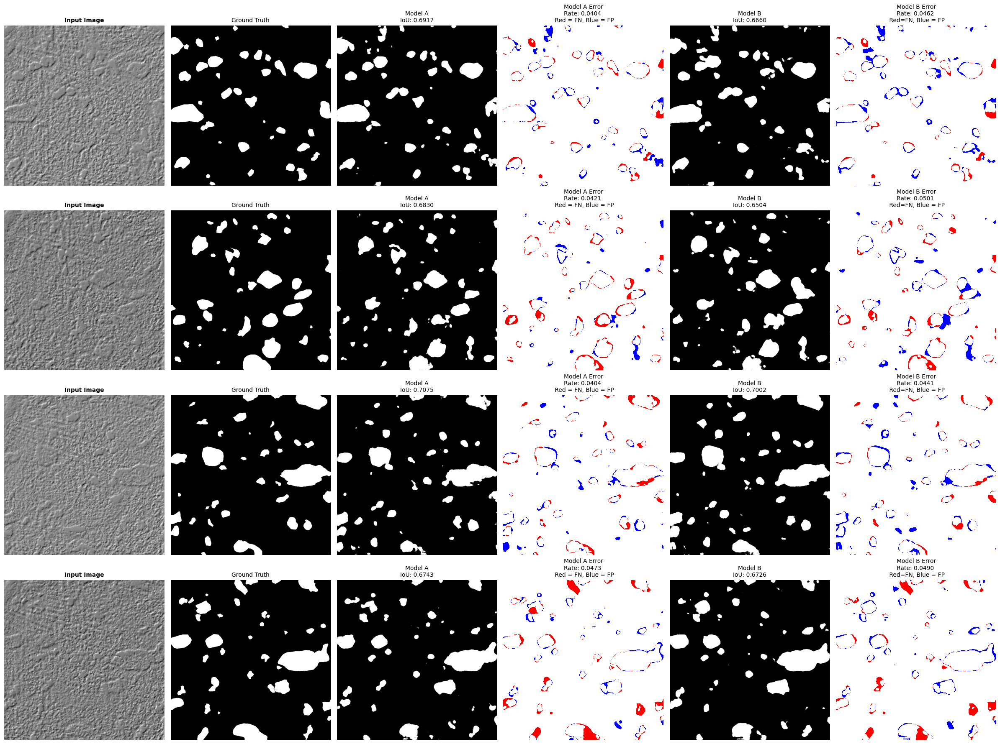

In [12]:
# Focal(alpha=0.25,gamma=2.0) + TverskyLoss( alpha=0.3, beta=0.7) vs Baseline

url = "https://github.com/maocili/Group15_Project21_02456/releases/download/v0.0.1/best_iou_Standard_loss_f_t_0.3_0.7_20251202_041128.pth"
ft_unet_path = helper.download_model(url)

ft_unet = UNet(in_channels=1, out_channels=2).to(device)
ft_unet.load_state_dict(torch.load(ft_unet_path, map_location=device, weights_only=True))

helper.visualize_comparison_validation(loader_A=denoise_loader, loader_B=denoise_loader,
                                       device=device, model_A=ft_unet, model_B=baseline_model,save_path=f"{FIG_DIR}/ft_37_vs_baseline.png")

### Result explanation
The results show that Model A (Focal + Tversky (alpha=0.3, beta=0.7)) performs similarly to the baseline model.

- Focal loss makes the model focus less on background pixels, which can introduce noise.
- This Tversky setting (alpha=0.3, beta=0.7) puts more weight on false negatives affecting boundary behavior.
- The baseline loss combination is more balanced for this dataset.

### Why compare them
We test this version of Tversky loss to see if changing its alpha and beta values improves sensitivity to small objects or reduces false positives.

File 'best_iou_Standard_tf_73_20251204_065016.pth' already exists. Skipping download.
torch.Size([4, 1, 768, 768]) torch.Size([4, 1, 768, 768])
Visualizing combined batch size: 4 (4 from A, 4 from B)
Figure saved to figures/ft_73_vs_baseline.png


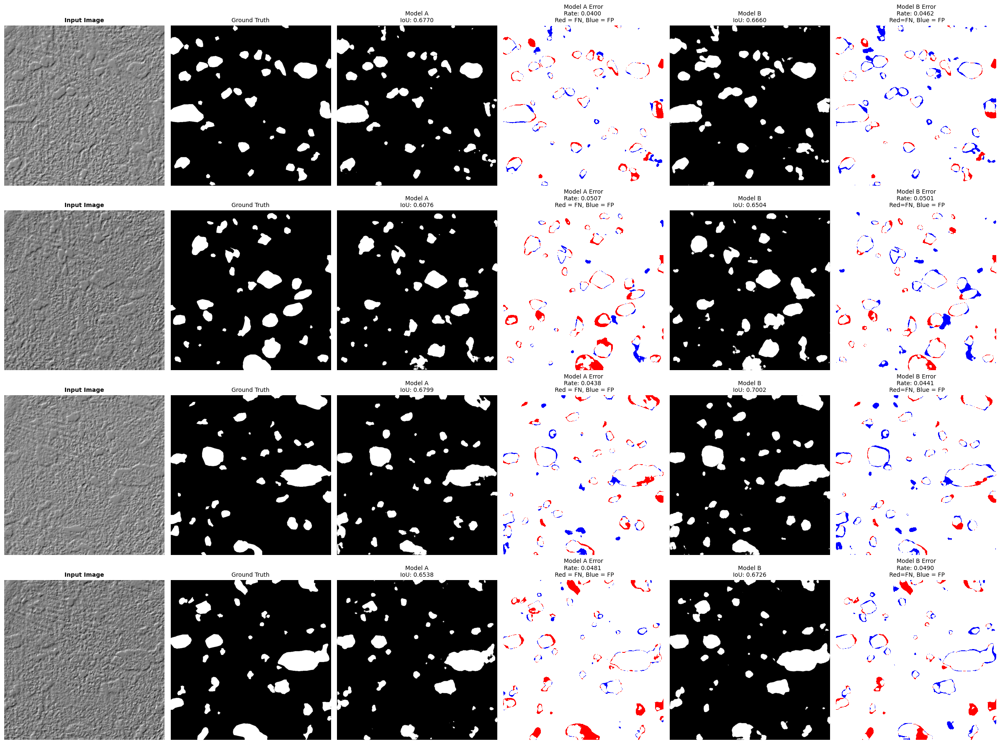

In [13]:
# Focal(alpha=0.25,gamma=2.0) + TverskyLoss( alpha=0.7, beta=0.3) vs Baseline

url = "https://github.com/maocili/Group15_Project21_02456/releases/download/v0.0.1/best_iou_Standard_tf_73_20251204_065016.pth"
ft_unet_path = helper.download_model(url)

ft_unet = UNet(in_channels=1, out_channels=2).to(device)
ft_unet.load_state_dict(torch.load(ft_unet_path, map_location=device, weights_only=True))

helper.visualize_comparison_validation(loader_A=denoise_loader, loader_B=denoise_loader,
                                       device=device, model_A=ft_unet, model_B=baseline_model,save_path=f"{FIG_DIR}/ft_73_vs_baseline.png")

### Result explanation
The results show that Model A (Tversky (alpha=0.7, beta=0.3)) performs similarly to the baseline as well.

- Tversky (alpha=0.7, beta=0.3) penalizes false positives more but still struggles with noisy boundaries.
- The baseline loss combination remains more stable and consistent.

### Why compare them
We test this alpha/beta setting to see how strongly penalizing false positives affects segmentation quality.

# Compare different loss functinos with IoU

In [2]:
ce_df = pd.read_csv("training_log/training_loss_ce_log_20251202_033557.csv")
ce_dice_df = pd.read_csv("training_log/training_loss_ce_dice_log_20251202_034620.csv")
f_logdice_df = pd.read_csv("training_log/training_loss_ce_logdice_log_20251202_040133.csv")
dice_df = pd.read_csv("training_log/training_dice_log_20251204_063916.csv")
baseline_df = pd.read_csv("training_log/training_baseline_log_20251204_062857.csv")
f_t_37_df = pd.read_csv("training_log/training_loss_f_t_0.3_0.7_log_20251202_041128.csv")
f_t_73_df = pd.read_csv("training_log/training_tf_73_log_20251204_065016.csv")

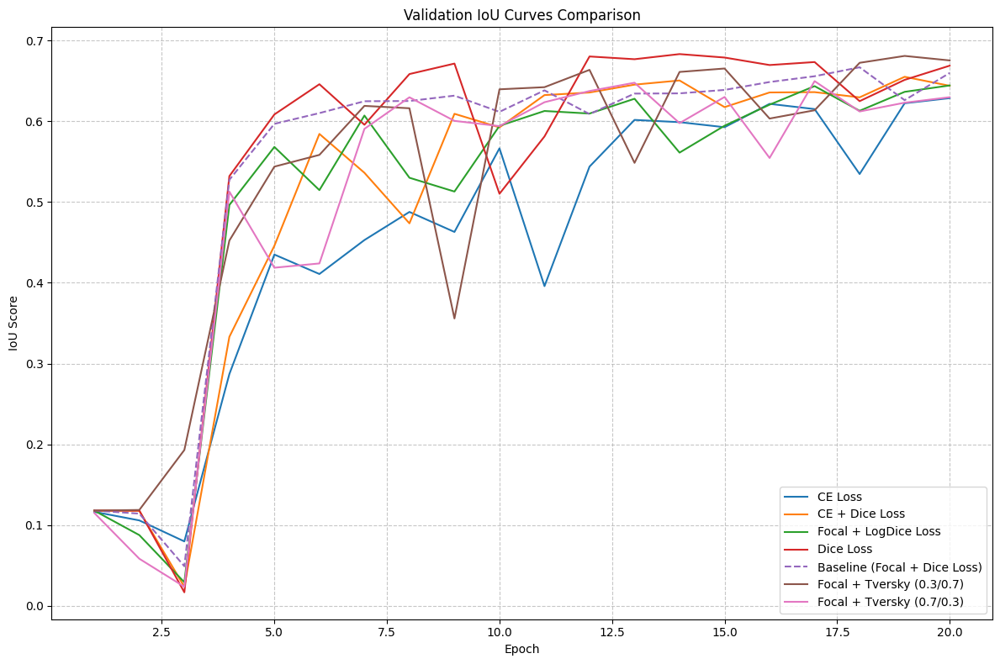

In [8]:
plt.figure(figsize=(12, 8))

plt.plot(ce_df['Epoch'], ce_df['Val_IoU'], label='CE Loss')
plt.plot(ce_dice_df['Epoch'], ce_dice_df['Val_IoU'], label='CE + Dice Loss')
plt.plot(f_logdice_df['Epoch'], f_logdice_df['Val_IoU'], label='Focal + LogDice Loss')
plt.plot(dice_df['Epoch'], dice_df['Val_IoU'], label='Dice Loss')
plt.plot(baseline_df['Epoch'], baseline_df['Val_IoU'], label='Baseline (Focal + Dice Loss)', linestyle='--')
plt.plot(f_t_37_df['Epoch'], f_t_37_df['Val_IoU'], label='Focal + Tversky (0.3/0.7)')
plt.plot(f_t_73_df['Epoch'], f_t_73_df['Val_IoU'], label='Focal + Tversky (0.7/0.3)')

plt.title('Validation IoU Curves Comparison')
plt.xlabel('Epoch')
plt.ylabel('IoU Score')
plt.legend(loc='lower right') 
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig(f"{FIG_DIR}/loss_iou.png")
plt.show()

### Result explanation
The results show that most loss functions follow a similar trend and reach IoU values between 0.60 and 0.68. However, the baseline model remains one of the most stable curves and consistently achieves high IoU.  

### Why compare them
We compare all loss functions to understand which one helps the U-Net learn the segmentation task more effectively and which loss settings lead to better stability and final accuracy.


# Compare baseline and mean-teacher model on the unlabeled data

In [16]:
from monai.inferers import sliding_window_inference

dataset_1h = TiffDataset(image_path="data/datasets/1h_HT", masks_path="",image_only=True,transforms=MicroTransformers(geo_augment=False))
h1_loader = DataLoader(dataset_1h, batch_size=1, shuffle=False,in_order=True)

count = 0
p_list = []
loop = tqdm(h1_loader, desc=f'Predict')
for img in loop:
    img = img.to(device)
    if img.ndim == 2:
        img = img.unsqueeze(0).unsqueeze(0)

    roi_size = (768, 768)
    sw_batch_size = 2
    overlap = 0.5

    with torch.no_grad():
        baseline_output = sliding_window_inference(
            inputs=img,
            roi_size=roi_size,
            sw_batch_size=sw_batch_size,
            predictor=baseline_model,
            overlap=overlap,
        )

        mt_output = sliding_window_inference(
            inputs=img,
            roi_size=roi_size,
            sw_batch_size=sw_batch_size,
            predictor=mt_model,
            overlap=overlap,
        )

    mt_pred = torch.argmax(mt_output, dim=1)
    mt_pred = mt_pred.cpu().numpy()

    baseline_pred = torch.argmax(baseline_output, dim=1)
    baseline_pred = baseline_pred.cpu().numpy()

    img = img.cpu().numpy()
    p_list.append((img, baseline_pred, mt_pred))

    count += 1
    if count  >= 4:
        break


/opt/anaconda3/envs/dtu_project_dl2/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Found 120  (image, mask) pairs


Predict:   0%|          | 0/120 [00:00<?, ?it/s]/opt/anaconda3/envs/dtu_project_dl2/lib/python3.11/site-packages/imageio/plugins/_tifffile.py:3344: UserWarning: read_bytes() missing 3 required positional arguments: 'dtype', 'count', and 'offsetsize'
  warnings.warn(str(e))
/opt/anaconda3/envs/dtu_project_dl2/lib/python3.11/site-packages/monai/inferers/utils.py:226: UserWarning: Using a non-tuple sequence for multidimensional indexing is deprecated and will be changed in pytorch 2.9; use x[tuple(seq)] instead of x[seq]. In pytorch 2.9 this will be interpreted as tensor index, x[torch.tensor(seq)], which will result either in an error or a different result (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/autograd/python_variable_indexing.cpp:351.)
  win_data = torch.cat([inputs[win_slice] for win_slice in unravel_slice]).to(sw_device)
/opt/anaconda3/envs/dtu_project_dl2/lib/python3.11/site-packages/monai/inferers/utils.py:370: UserWarning: Using a non-tuple 

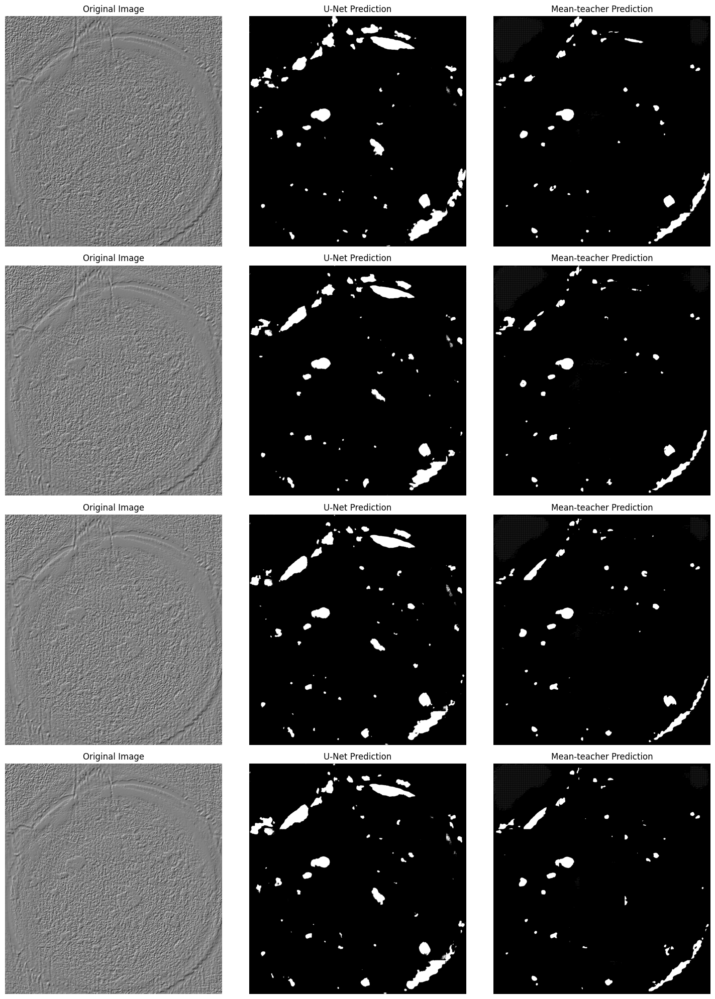

In [17]:
N_rows = len(p_list)
N_cols = 3  # (Original Image, Baseline Pred, MT Pred)

fig, axes = plt.subplots(nrows=N_rows, ncols=N_cols, figsize=(15, N_rows * 5))

for i, (img, baseline_pred, mt_pred) in enumerate(p_list):
    
    original_img = np.squeeze(img)

    ax_img = axes[i, 0] if N_rows > 1 else axes[0]
    ax_img.imshow(original_img, cmap='gray') 
    ax_img.set_title(f'Original Image')
    ax_img.axis('off')

    ax_base = axes[i, 1] if N_rows > 1 else axes[1]
    ax_base.imshow(np.squeeze(baseline_pred), cmap='gray') 
    ax_base.set_title('U-Net Prediction')
    ax_base.axis('off')

    ax_mt = axes[i, 2] if N_rows > 1 else axes[2]
    ax_mt.imshow(np.squeeze(mt_pred), cmap='gray')
    ax_mt.set_title('Mean-teacher Prediction')
    ax_mt.axis('off')

fig.tight_layout()
plt.savefig(f"{FIG_DIR}/predict_on_1h_dataset.png")
plt.show()